# PROBLEMA: ESTIMATIVA EXPERIMENTAL DA COMPLEXIDADE DE UMA FUNÇÃO DE UMA BIBLIOTECA

# Métodos de segmentação de imagens do tipo  Thresholding (Limiarização): 
> Divide uma imagem em regiões ou objetos binários com base em um valor de limiar. Bibliotecas: OpenCV, scikit-image.


## BIBLIOTECAS

In [1]:
%matplotlib inline
#pip install -U scikit-learn
#pip install imagehash
#pip install -U matplotlib

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

from sklearn.cluster import DBSCAN, KMeans

import seaborn as sns
sns.set()

from PIL import Image

import numpy as np
from numpy import mean
from numpy import isnan
from numpy import asarray

import os
import shutil, glob, os.path

from random import shuffle

from tqdm import tqdm

import math

import skimage
from skimage import data, io, color
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu 
from skimage.feature import canny 
from time import time
from random import randint
import cv2

from scipy import stats


## **2. Leitura das imagens na pasta**

files in directory:  ./faces 
 ['branca01.jpg', 'branca02.jpg', 'branca03.jpg', 'casal_branco01.jpg', 'casal_moreno01.jpg', 'familia_branca01.jpg', 'familia_morena01.jpg', 'homem_branco01.jpg', 'homem_branco02.jpg', 'homem_branco03.jpg', 'homem_branco04.jpg', 'homem_moreno01.jpg', 'homem_moreno02.jpg', 'homem_moreno03.jpg', 'homem_moreno04.jpg', 'image_teste_segementacao_3_classes.png', 'jovem_branco01.jpg', 'jovem_branco02.jpg', 'jovem_branco03.jpg', 'jovem_branco04.jpg', 'jovem_loura01.jpg', 'jovem_moreno01.jpg', 'jovem_moreno02.jpg', 'jovem_moreno03.jpg', 'jovem_moreno04.jpg', 'morena01.jpg', 'morena02.jpg', 'morena03.jpg', 'mulher_morena01.jpg', 'mulher_morena02.jpg', 'mulher_morena03.jpg', 'senhora_branca01.jpg', 'senhora_branca02.jpg', 'senhora_branca03.jpg', 'senhora_branca04.jpg', 'senhora_morena01.jpg', 'senhora_morena02.jpg', 'senhora_morena03.jpg', 'senhora_morena04.jpg', 'senhor_branco01.jpg', 'senhor_branco02.jpg', 'senhor_branco03.jpg', 'senhor_branco04.jpg', 'senhor_more

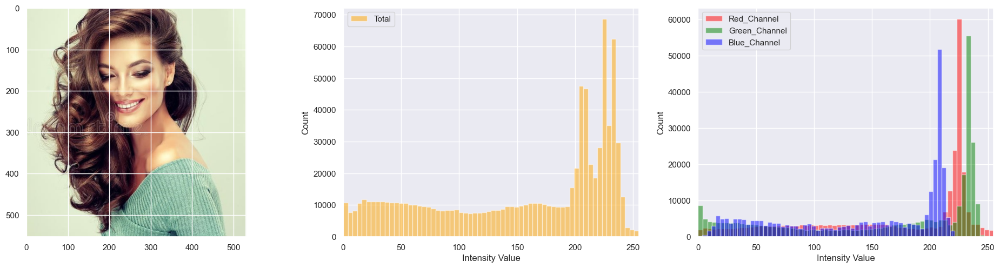


Imagem # 2 : branca02.jpg
resolução da imagem:  (900, 675, 3)
number of color channels:  3


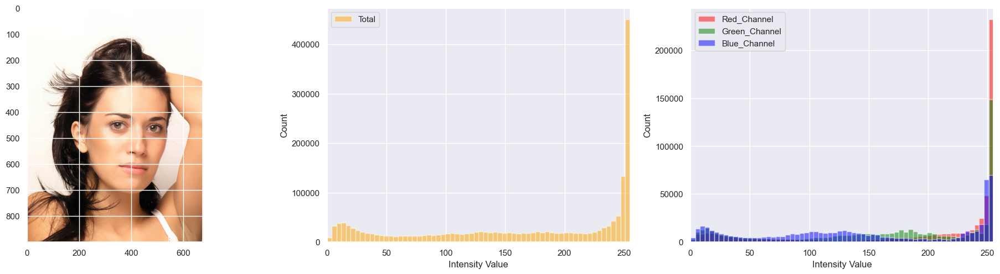


Imagem # 3 : branca03.jpg
resolução da imagem:  (533, 626, 3)
number of color channels:  3


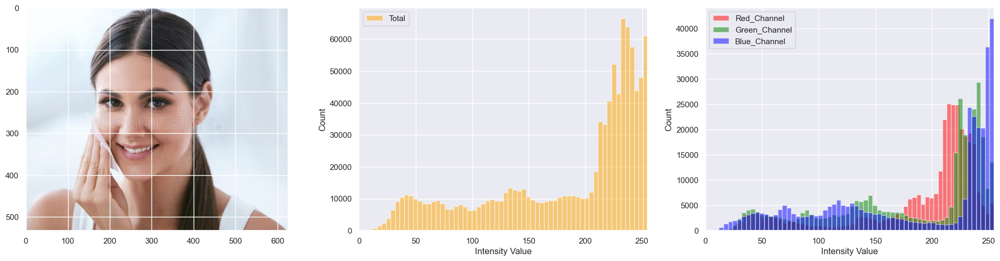


Imagem # 4 : casal_branco01.jpg
resolução da imagem:  (533, 800, 3)
number of color channels:  3


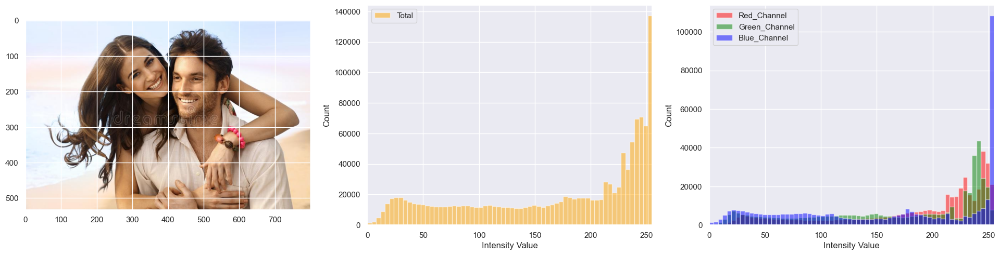


Imagem # 5 : casal_moreno01.jpg
resolução da imagem:  (533, 800, 3)
number of color channels:  3


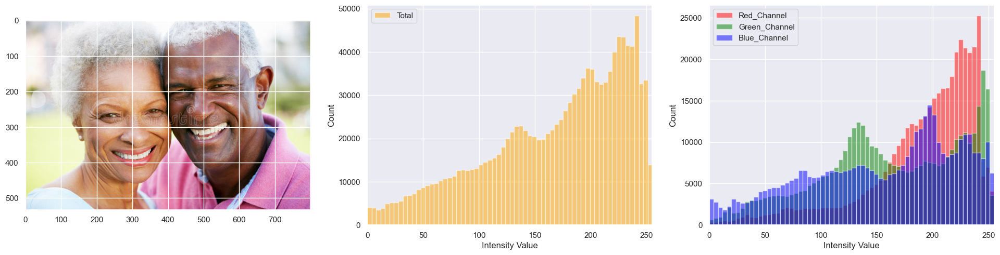


Imagem # 6 : familia_branca01.jpg
resolução da imagem:  (533, 800, 3)
number of color channels:  3


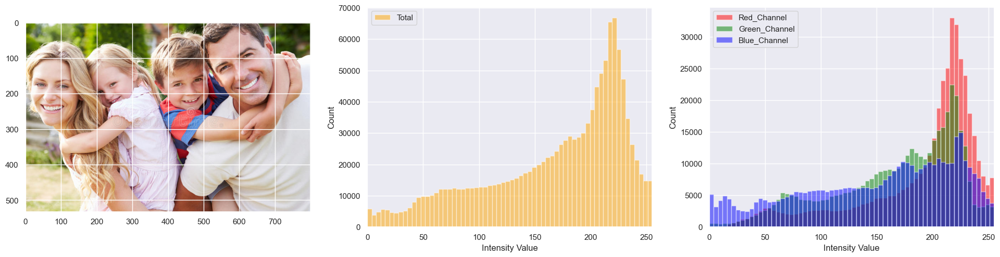


Imagem # 7 : familia_morena01.jpg
resolução da imagem:  (533, 800, 3)
number of color channels:  3


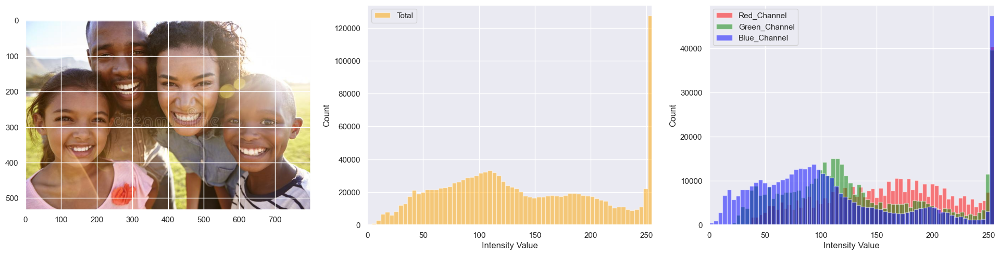


Imagem # 8 : homem_branco01.jpg
resolução da imagem:  (532, 426, 3)
number of color channels:  3


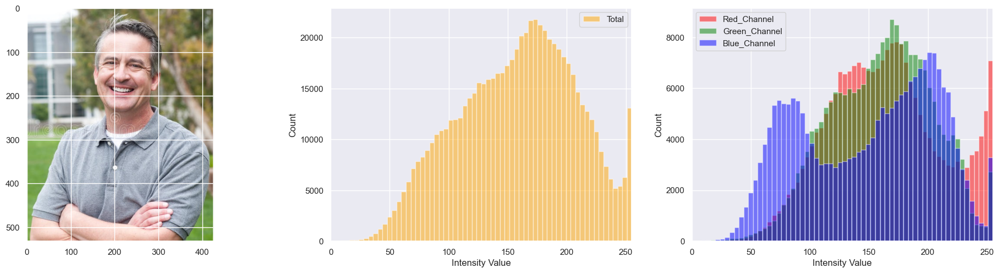


Imagem # 9 : homem_branco02.jpg
resolução da imagem:  (504, 652, 3)
number of color channels:  3


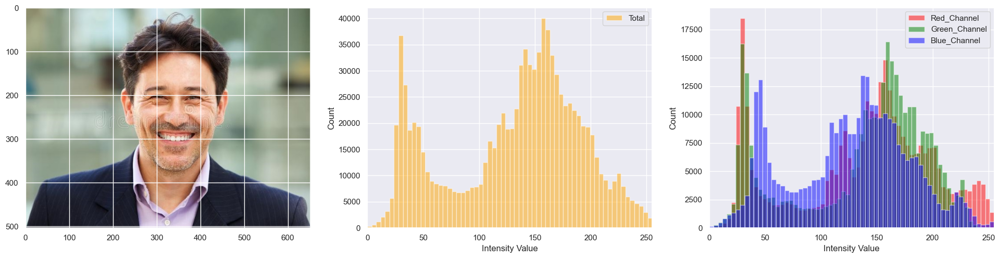


Imagem # 10 : homem_branco03.jpg
resolução da imagem:  (525, 602, 3)
number of color channels:  3


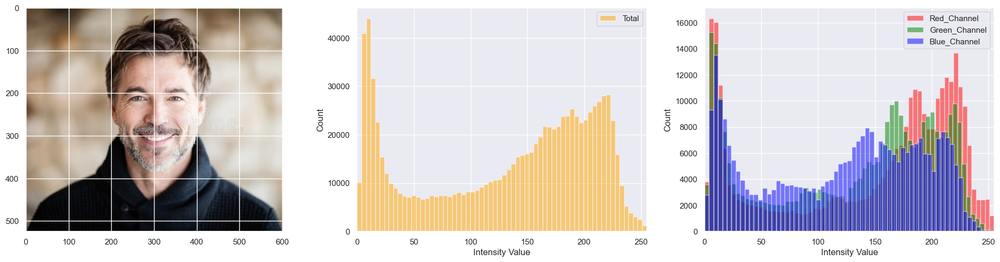


Imagem # 11 : homem_branco04.jpg
resolução da imagem:  (558, 404, 3)
number of color channels:  3


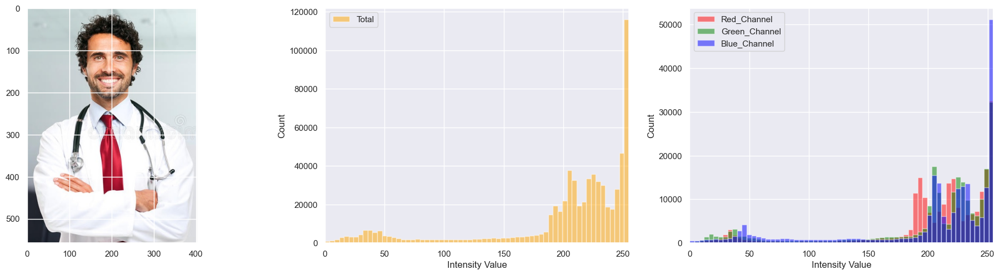


Imagem # 12 : homem_moreno01.jpg
resolução da imagem:  (534, 585, 3)
number of color channels:  3


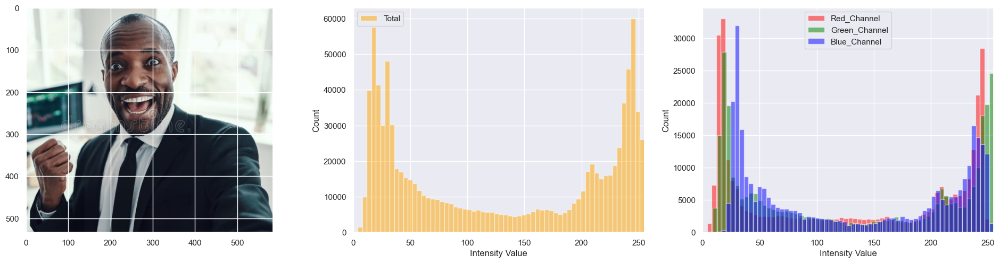


Imagem # 13 : homem_moreno02.jpg
resolução da imagem:  (900, 600, 3)
number of color channels:  3


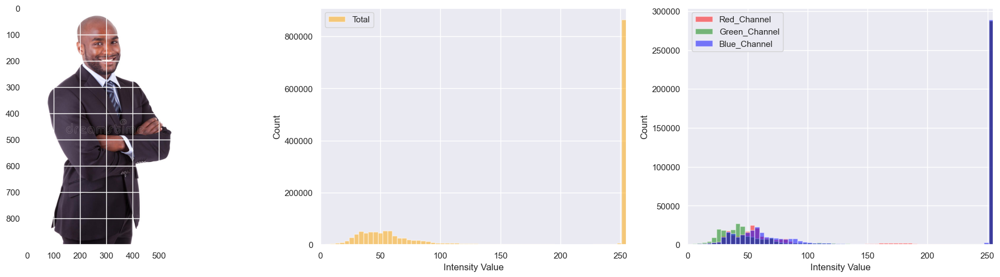


Imagem # 14 : homem_moreno03.jpg
resolução da imagem:  (533, 413, 3)
number of color channels:  3


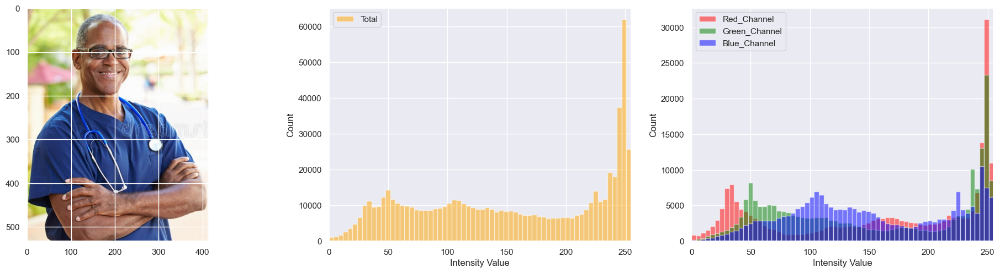


Imagem # 15 : homem_moreno04.jpg
resolução da imagem:  (517, 568, 3)
number of color channels:  3


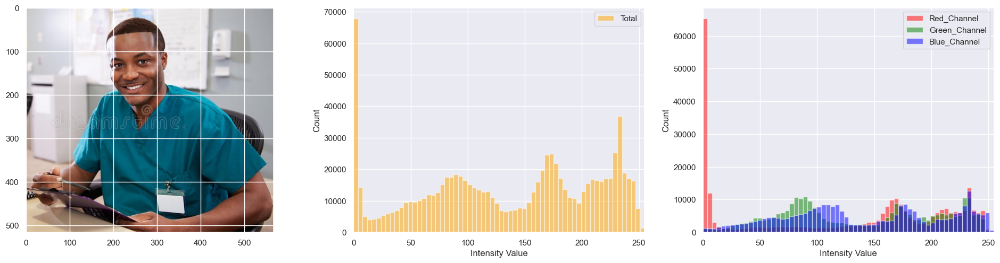

In [2]:
# PREPROCESSAMENTO DAS IMAGENS
#INPUT_PATH = 'D:\\Users\\diego\\Google Drive\\AUNEB\\ADocencia\\EP\\datasets\\faces'
INPUT_PATH = './faces'
Files=os.listdir(INPUT_PATH)
print("files in directory: ",INPUT_PATH,"\n",os.listdir(INPUT_PATH))

Img=[]
img=[]
ncolors=[]
ResX=[]
ResY=[]
n=[]

nImg = 15 # mnumero de imagens a processar na ordem de leitura
print("\nSelecionadas as ",nImg,"primeiras imagens")
ctr = 1
for filename in Files[:nImg]: 
    if filename.endswith('.jpg') or filename.endswith('.png'): # filtro formato da imagem
        try:
            img.append(io.imread(INPUT_PATH+"/"+filename))#, as_gray=as_gray)) # open the image file
            print("\nImagem #",ctr,':',filename)
            ctr+=1
            print("resolução da imagem: ",img[-1].shape)
            Img.append(img[-1]) # backup of original images
            ncolors.append(img[-1].shape[-1])
            ResX.append(img[-1].shape[0])
            ResY.append(img[-1].shape[1])
            n.append(ResX[-1]*ResY[-1])
            print("number of color channels: ", ncolors[-1])
         
#             plt.style.use('grayscale')
#             if ncolors[-1]>1: # if it is RGB convert to grayscale
#                 img[-1]=np.round(255*rgb2gray(img[-1])) # foca = [1,2,0,2]
#             ncolors[-1]=1
            fig2, ax2 = plt.subplots(1,3, figsize=(24, 5.5))
            ax2[0].imshow(img[-1])
            ax2[1].hist(img[-1].ravel(), bins = 64, color = 'orange', alpha = 0.5)
            ax2[1].legend(['Total'])
            ax2[2].hist(img[-1][:, :, 0].ravel(), bins = 64, color = 'Red', alpha = 0.5)
            ax2[2].hist(img[-1][:, :, 1].ravel(), bins = 64, color = 'Green', alpha = 0.5)
            ax2[2].hist(img[-1][:, :, 2].ravel(), bins = 64, color = 'Blue', alpha = 0.5)
            ax2[2].legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
            ax2[1].set_xlim(0, 255)
            ax2[1].set_xlabel('Intensity Value')
            ax2[1].set_ylabel('Count')
            ax2[2].set_xlim(0, 255)
            ax2[2].set_xlabel('Intensity Value')
            ax2[2].set_ylabel('Count')
            plt.show()
        except (IOError, SyntaxError) as e:
            print('Bad file:', filename)
            #os.remove(base_dir+"\\"+filename) (Maybe)


# 3. Realizando R repetições medindo o tempo do experimento de binarização de imagens com o método de OTSU, usando nImg imagens de resoluções distintas

n: [293643, 607500, 333658, 426400, 426400, 426400, 426400, 226632, 328608, 316050, 225432, 312390, 540000, 220129, 293656]
processando imagem 1


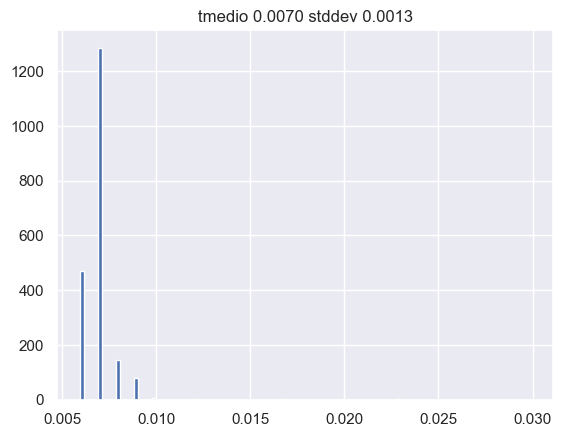

Limiar OTSU: 133.44921875 calculado em 0.00698114550113678 segundos, numa imagem de 293643 pixels


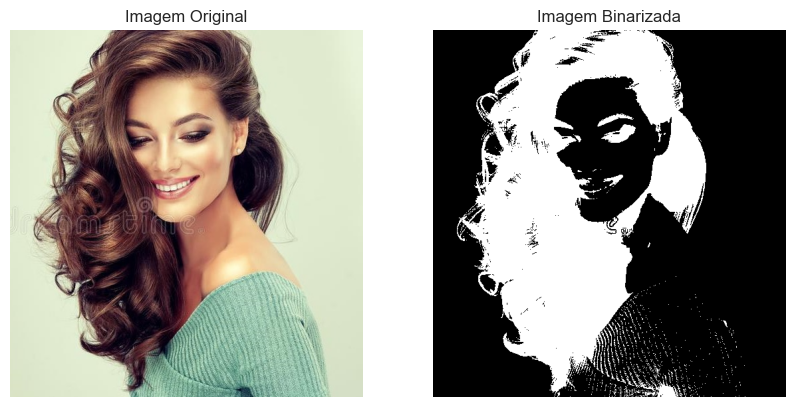

processando imagem 2


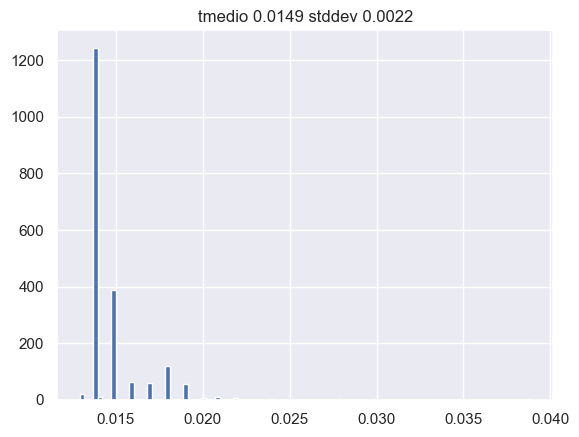

Limiar OTSU: 136.962890625 calculado em 0.014898159980773925 segundos, numa imagem de 607500 pixels


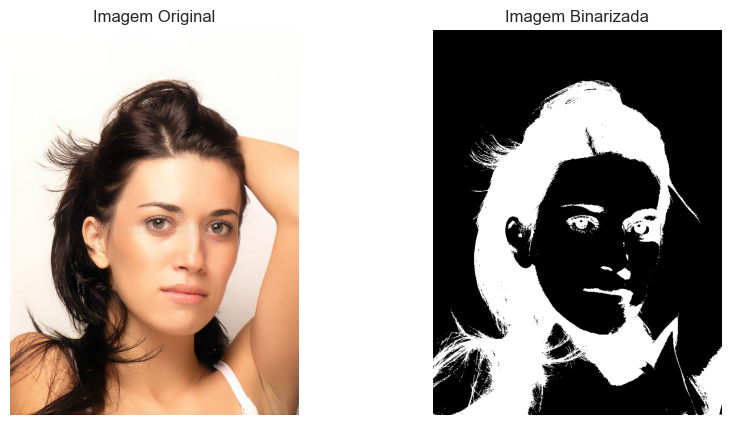

processando imagem 3


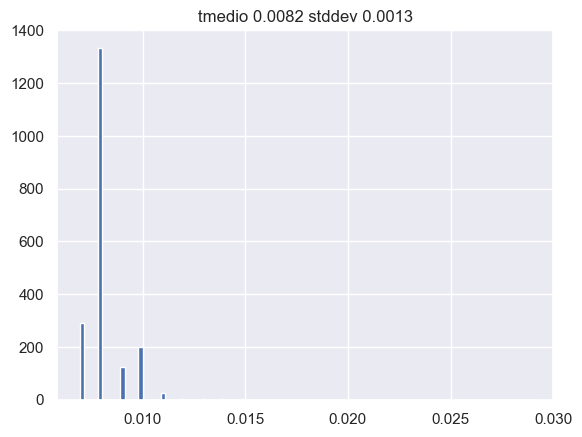

Limiar OTSU: 163.9453125 calculado em 0.008218507051467896 segundos, numa imagem de 333658 pixels


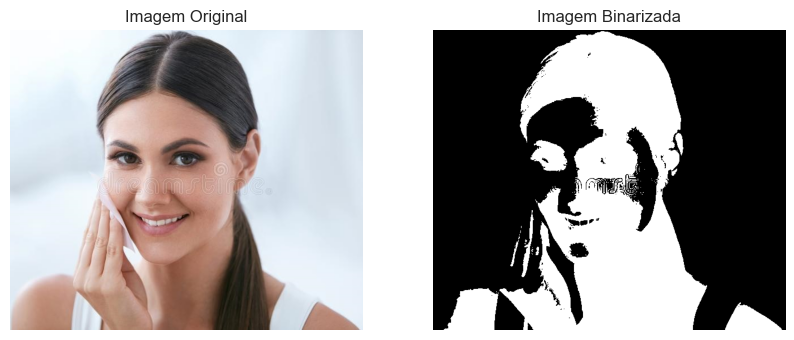

processando imagem 4


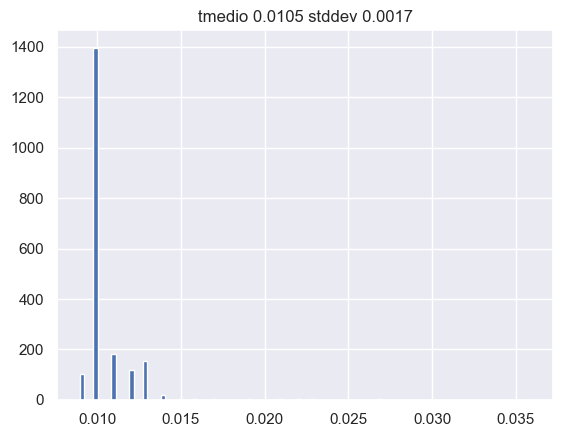

Limiar OTSU: 151.904296875 calculado em 0.010539242744445801 segundos, numa imagem de 426400 pixels


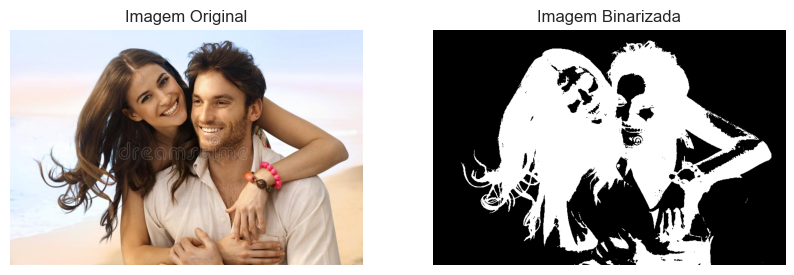

processando imagem 5


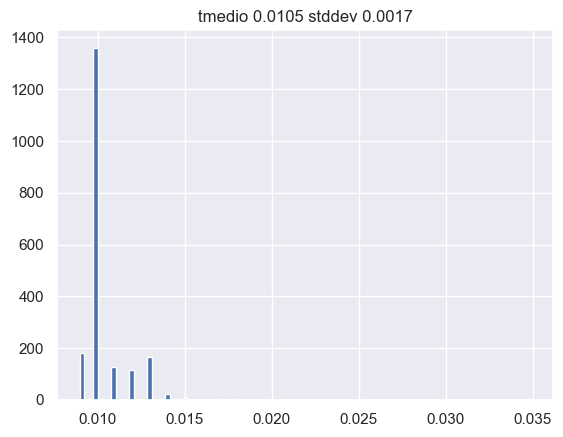

Limiar OTSU: 162.861328125 calculado em 0.010490904808044434 segundos, numa imagem de 426400 pixels


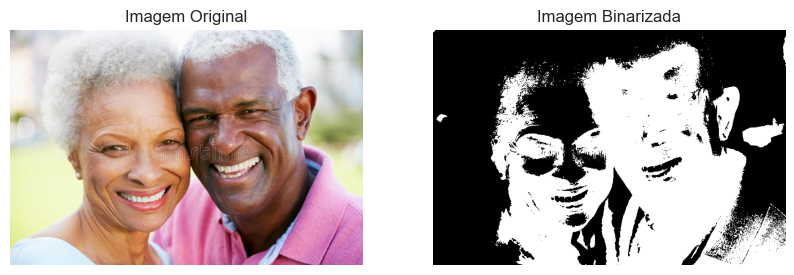

processando imagem 6


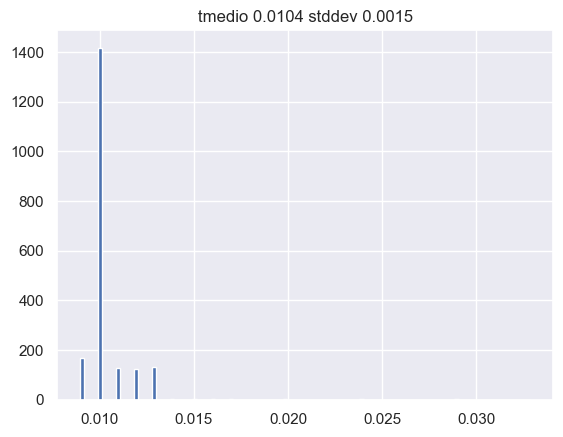

Limiar OTSU: 149.33203125 calculado em 0.010392234802246094 segundos, numa imagem de 426400 pixels


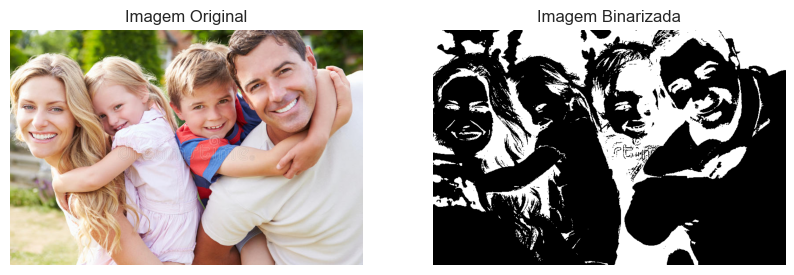

processando imagem 7


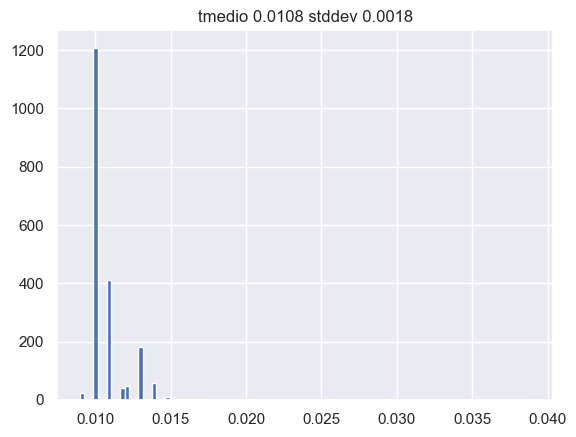

Limiar OTSU: 156.755859375 calculado em 0.010790403008460998 segundos, numa imagem de 426400 pixels


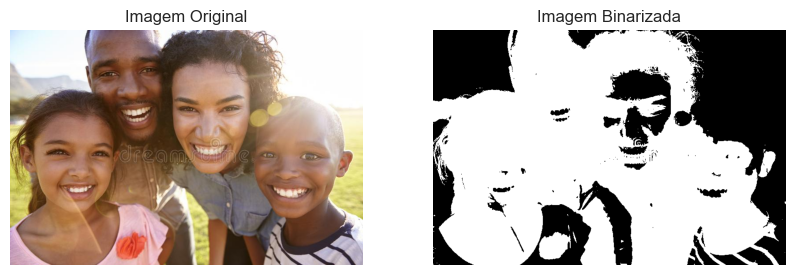

processando imagem 8


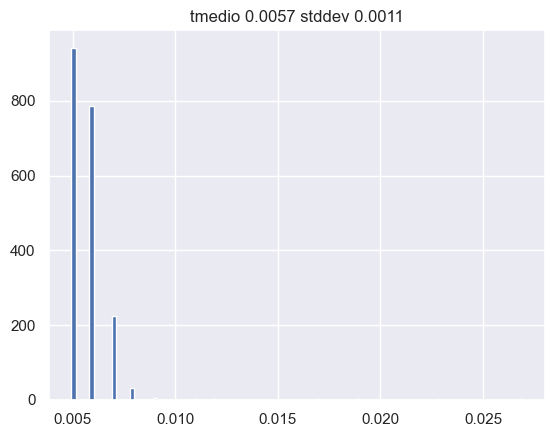

Limiar OTSU: 158.423828125 calculado em 0.00571587860584259 segundos, numa imagem de 226632 pixels


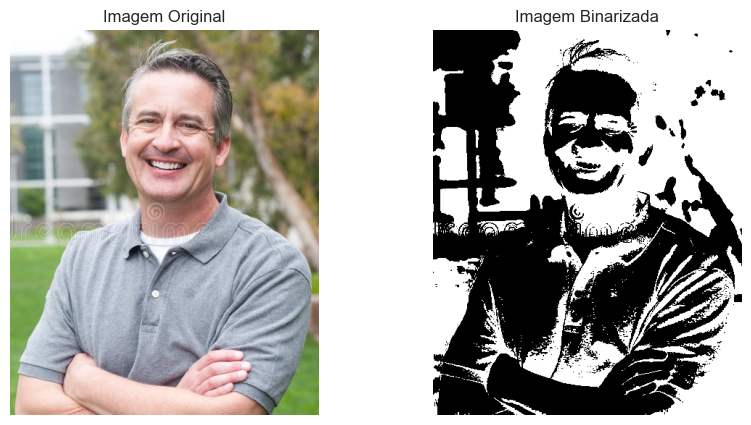

processando imagem 9


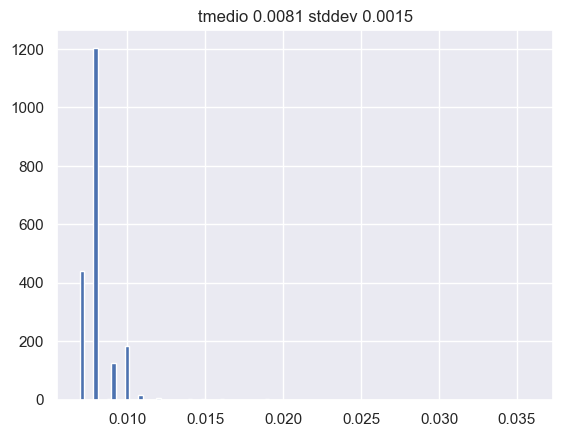

Limiar OTSU: 106.400390625 calculado em 0.00814874029159546 segundos, numa imagem de 328608 pixels


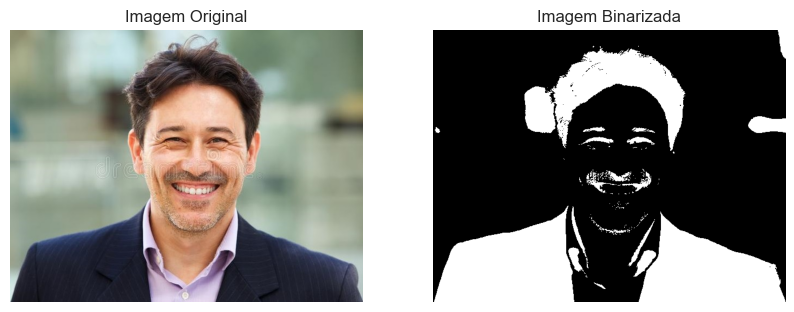

processando imagem 10


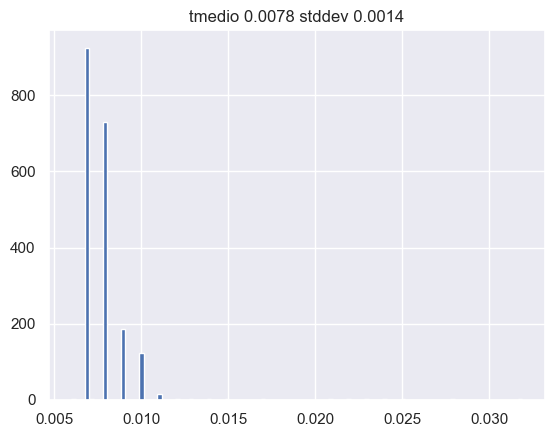

Limiar OTSU: 110.62890625 calculado em 0.007830803990364074 segundos, numa imagem de 316050 pixels


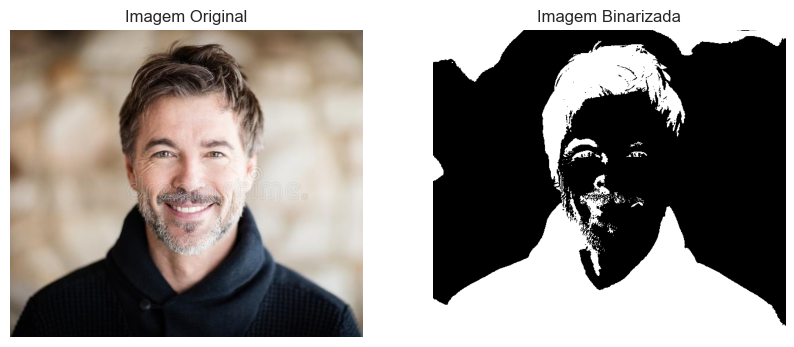

processando imagem 11


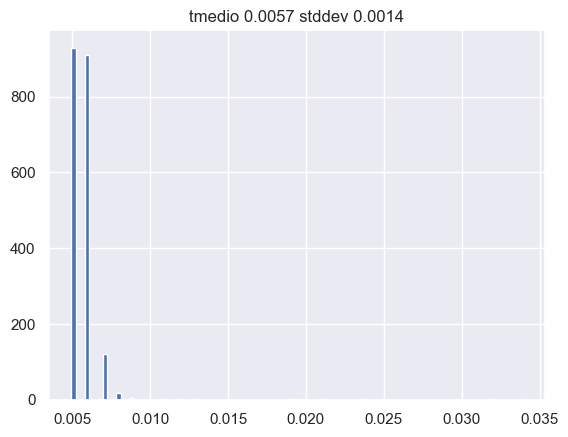

Limiar OTSU: 142.939453125 calculado em 0.0056909615993499755 segundos, numa imagem de 225432 pixels


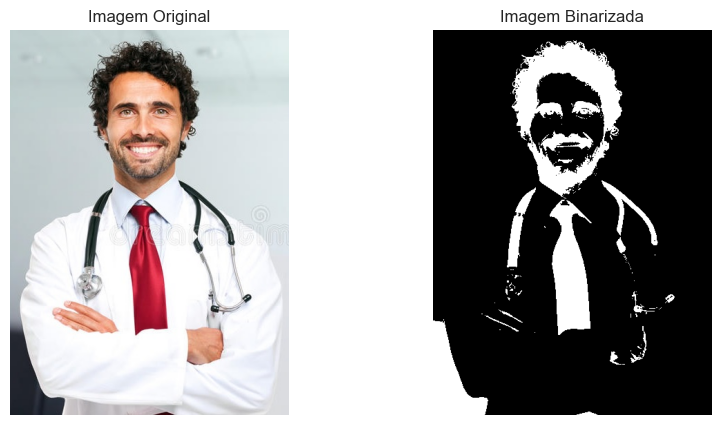

processando imagem 12


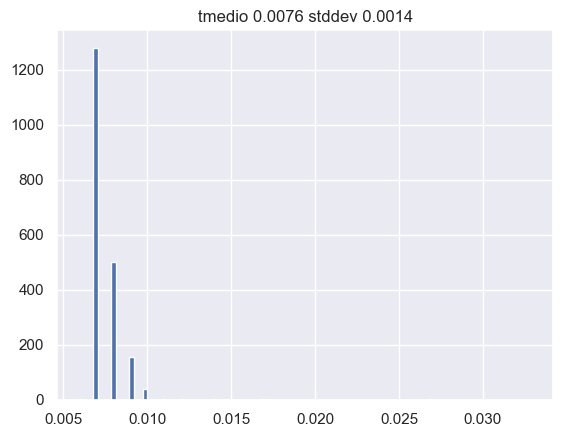

Limiar OTSU: 132.947265625 calculado em 0.007550740122795105 segundos, numa imagem de 312390 pixels


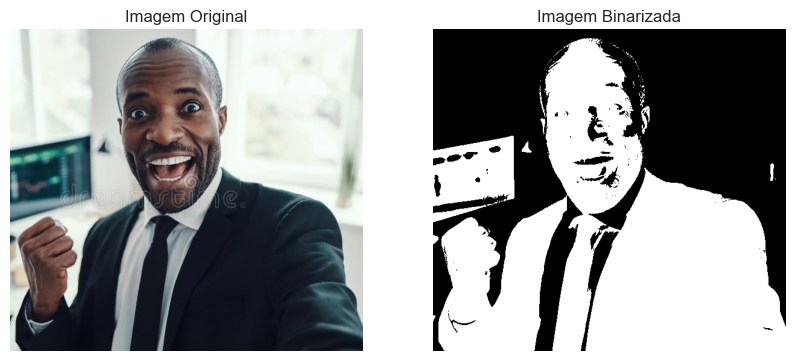

processando imagem 13


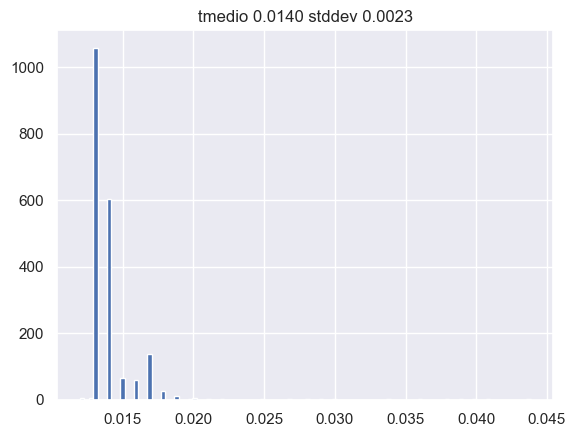

Limiar OTSU: 153.896484375 calculado em 0.013994184255599975 segundos, numa imagem de 540000 pixels


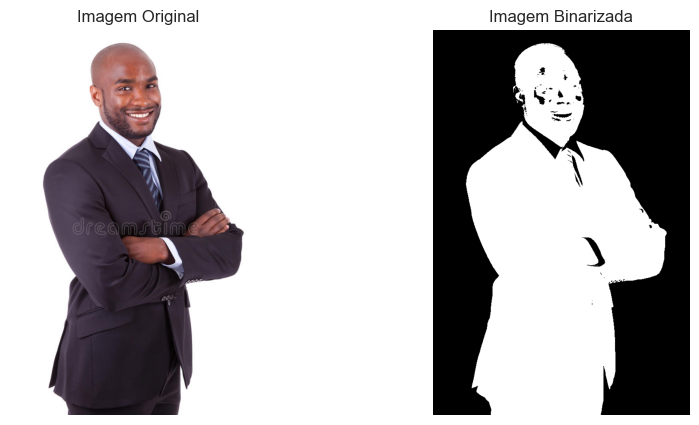

processando imagem 14


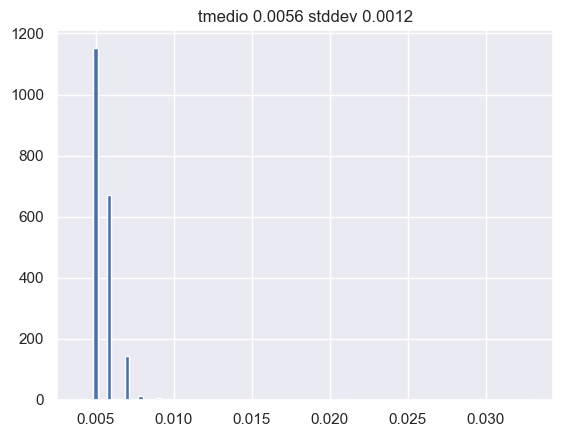

Limiar OTSU: 153.30078125 calculado em 0.005556412696838379 segundos, numa imagem de 220129 pixels


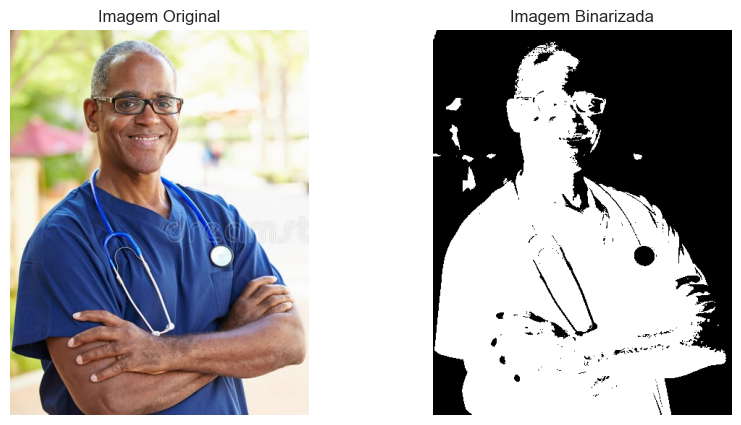

processando imagem 15


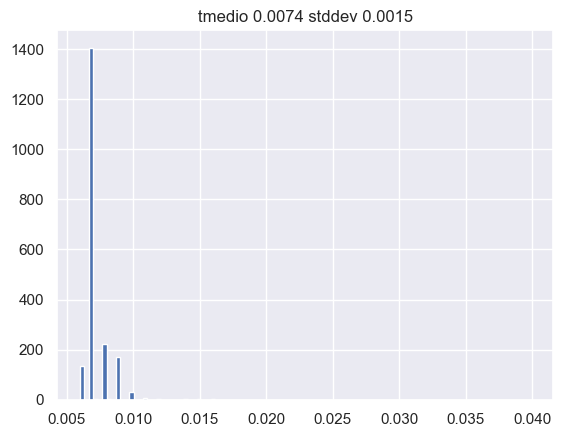

Limiar OTSU: 134.970703125 calculado em 0.007364311218261719 segundos, numa imagem de 293656 pixels


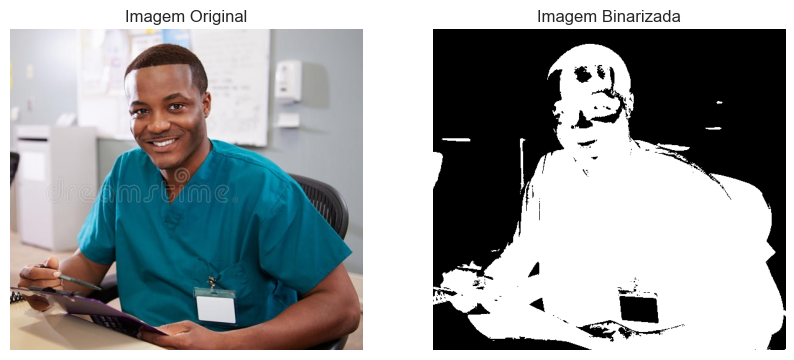

In [3]:
print("n:",n)
R = 2000
ctr=0
t=[]
s=[]

for image in Img[:nImg]: 
    # Converter a imagem para escala de cinza
    print("processando imagem",ctr+1)
    T = []
    #REPETIÇÕES DO EXPERIMENTO--SEM PLOTAR-SÓ PARA MEDIR O TEMPO MEDIO--E CTRLE QLD <<<<
    for r in range(R):
        tic=time()
        # define uma função INICIO
        bw_img = np.round(255*rgb2gray(image))
#         print(bw_img)
        # Converter a imagem para escala de cinza e aplicar thresholding usando o método de Otsu   
        limiar = threshold_otsu(bw_img)
        # construir a mascara binarizada da imagem
        imagem_binarizada = bw_img > limiar
        # define uma função FIM
#         print(imagem_binarizada)
        toc = time()
        T.append((toc-tic))
        
    # Gerar uma lista com os valores que não excedem K vezes a média
    t.append(np.mean(T))
    s.append(np.std(T))
    
    plt.hist(T,100)
#     plot(T)
    plt.title("tmedio {:.4f}".format(t[-1])+" stddev {:.4f}".format(s[-1]))
    plt.show()
    print("Limiar OTSU:",limiar,"calculado em",t[-1],"segundos, numa imagem de",n[ctr],"pixels")
    
    # Plotar a imagem original e a imagem binarizada
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Imagem Original')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(imagem_binarizada, cmap='binary')
    plt.title('Imagem Binarizada')
    plt.axis('off')

    plt.show()
    ctr+=1

# 4.a Plotando os tempos estimados (de forma grosseira) em função do tamanho do problema (n)

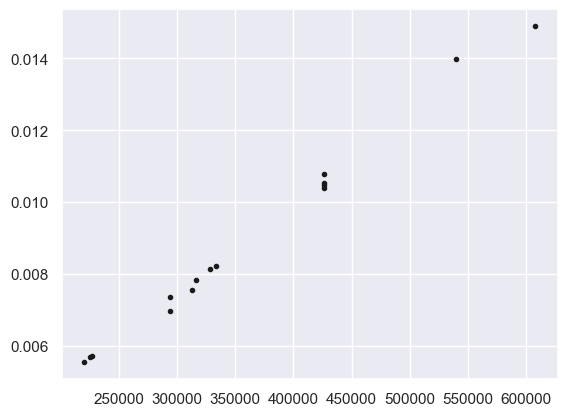

In [4]:
plt.plot(n,t,"k.")
plt.show()

# 4.b verificando a estabilidade do sistema computacional usado no experimento

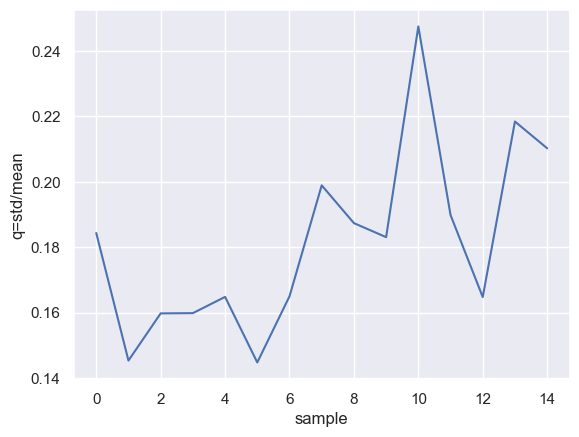

In [5]:
plt.plot(np.array(s)/np.array(t))
plt.xlabel('sample')
plt.ylabel('q=std/mean')
plt.show()

# 5. Determinando a função que ajusta os dados para estimar "experimentalmente" a complexidade do algoritmo

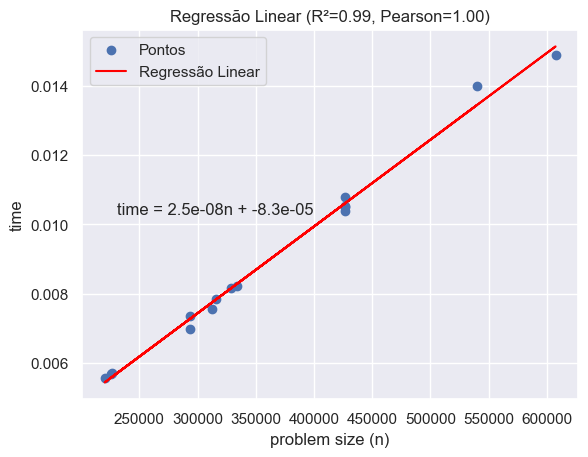

In [6]:
# Calcular a regressão linear -> primeira lternativa !!1
slope, intercept, r_value, p_value, std_err = stats.linregress(n, t)
line = slope * np.array(n) + intercept

# Calcular R^2 (coeficiente de determinação) e o coeficiente de correlação de Pearson
r_squared = r_value ** 2
pearson_coeficiente = r_value

# Plotar os pontos e a linha de regressão linear
plt.scatter(n, t, label='Pontos')
plt.plot(n, line, color='red', label='Regressão Linear')

# Adicionar título com R^2 e o coeficiente de correlação de Pearson
titulo = f'Regressão Linear (R²={r_squared:.2f}, Pearson={pearson_coeficiente:.2f})'
plt.title(titulo)
# Adicionar legenda para a equação da linha
plt.text(0.07, 0.5, f'time = {slope:.2g}n + {intercept:.2g}', fontsize=12, transform=plt.gca().transAxes)

# Adicionar legendas
plt.xlabel('problem size (n)')
plt.ylabel('time')
plt.legend()

# Exibir o gráfico
plt.show()

# 6. Conclusão do estudo: como a função linear fez um ajuste de alta qualidade ($R^2>0.95$ e $Pearson > 0.95$), concluimos que o algoritmo OTSU implementado na biblioteca python usada, tem complexidade O(n) 

# Questão:
> Quantos segundos se espera que demore a binarização de uma imagem com resolução 600 X 1200 pixels? 

#  x  =  f(arg) => foca =  [T_resposta, operações no arg, comparações no arg, atribuições no argumento + 1] 

## arg = estrutura, dado, tamanho

Exemplo:

x = f (a, n+1, 3 if x>2, else 1, Img)  => foca ?

# NOTA: T_resposta = função de n




















